# Import modules required for Visualization
---

In [1]:
import matplotlib.pyplot as plt
import hvplot.pandas
import holoviews as hv
import seaborn as sns
from MCForecastTools import MCSimulation

from mpt_quant_analysis import *
from mpt_performance_eval import *

import warnings
warnings.filterwarnings('ignore')

# Visualization for: "mpt_quant_analysis.py"
---

### Standard Asset Statistics / Frequencey Components

In [2]:
# Display constants being used for this module
print("Number of trading days per year = ", num_trading_days)
print("Risk free rate = ", risk_free_rate)
print("Number of random portfolio runs = ", num_random_portfolio_run)
print("Number of days in rolling window = ", rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.02
Number of random portfolio runs =  50000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.8
Number of days of input dataframe to use as test/experiment data  =  0.19999999999999996


In [3]:
# Get asset prices from .csv files
asset_mkt_prices_full_df = mpt_qa_get_asset_prices_csv('./Resources/mpt_symbols.csv')

# Display the first 5 elements of the market and asset data prices
print("Asset Prices:")
display(asset_mkt_prices_full_df.head(n=1))
display(asset_mkt_prices_full_df.tail(n=1))

Asset Prices:


,MARKET,AAPL,CSCO,IBM,AMZN
Date,,,,,
2016-01-04,178.051315,24.151495,21.344944,95.968567,31.849501


,MARKET,AAPL,CSCO,IBM,AMZN
Date,,,,,
2020-12-31,364.7388,131.333511,42.152077,110.466835,162.846497


In [4]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_full_df.drop(['MARKET'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df.head(n=1))
display(asset_prices_df.tail(n=1))

Asset Prices DataFrame (does not include market)


,AAPL,CSCO,IBM,AMZN
Date,,,,
2016-01-04,24.151495,21.344944,95.968567,31.849501


,AAPL,CSCO,IBM,AMZN
Date,,,,
2020-12-31,131.333511,42.152077,110.466835,162.846497


In [5]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = asset_prices_df.shape[0]
num_historical_days_percent = round(num_days_total * historical_days_percent)
num_test_days_percent = round(num_days_total * test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data = ", num_historical_days_percent)
print("Total # of days will use for testing results = ", num_test_days_percent)

# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = asset_mkt_prices_full_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = asset_mkt_prices_full_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

# Extract the days from full dataframe will use for historical data
asset_prices_historical_df = asset_prices_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_prices_test_df = asset_prices_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  1259
Total # of days will use for hisotrical data =  1007
Total # of days will use for testing results =  252


In [6]:
# Plot the asset prices
asset_prices_historical_df.hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="Historical Dates Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [7]:
# Plot the asset prices
asset_prices_test_df.hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="Test Dates Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [8]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df          = mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [9]:
# Review the first five rows of the daily returns DataFrame.
print("Asset Retuns:")
display(asset_mkt_prices_returns_df.head(n=1))

# Plot the asset returns
asset_mkt_prices_returns_df.hvplot.line(
    ylabel="Returns", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="Market & Assets Returns"
)

Asset Retuns:


,MARKET,AAPL,CSCO,IBM,AMZN
Date,,,,,
2016-01-05,0.00169,-0.025379,-0.004554,-0.000736,-0.005036


:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [54]:
asset_mkt_prices_returns_df.hvplot.hist(bins=100, subplots=True, width=400, group_label='Ticker', grid=True).cols(3)

:NdLayout   [Default]
   :Histogram   [AMZN]   (AMZN_count)

In [10]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [11]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.hvplot(
    kind = "box",
    width = 800,
    height = 500,
    rot = 90,
    title = "Asset & Market: Daily Returns Box Plot")

:BoxWhisker   [Variable]   (value)

In [12]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


MARKET    0.128840
IBM       0.204571
CSCO      0.224203
AAPL      0.243906
AMZN      0.277958
dtype: float64

In [13]:
asset_mkt_prices_std_rolling_df.hvplot(
    title = "Assets & Market: Daily Return Standard Deviation w/ Rolling Window = 20",
    width = 800,
    height = 500
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [14]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 800,
    height = 500,
    title = "Assets & Market: Annual Sharpe Ratio")

Assets & Market: Annual Sharpe Ratio (Sorted):


IBM       0.186786
CSCO      0.800719
AMZN      0.960755
MARKET    1.068042
AAPL      1.123522
dtype: float64

:Bars   [index]   (0)

In [15]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['MARKET'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df.head(n=1))
display(asset_prices_df.tail(n=1))

# Recompute frequence components (e.g. covariance matrix will be different).  TODO: Optimize dataframe creating by sharing data
asset_prices_returns_df,        \
asset_prices_ann_returns_mean,  \
asset_prices_std_df,            \
asset_prices_ann_std_df,        \
asset_prices_std_rolling_df,    \
asset_prices_ann_cov_mtrx_df,   \
asset_prices_ann_corr_mtrx_df,  \
asset_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df      = mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,AAPL,CSCO,IBM,AMZN
Date,,,,
2016-01-04,24.151495,21.344944,95.968567,31.849501


,AAPL,CSCO,IBM,AMZN
Date,,,,
2019-12-31,72.039871,43.674778,111.766243,92.391998


In [16]:
print("Annual Covariance Matrix:")
display(asset_prices_ann_cov_mtrx_df)
print("Correlation Matrix:")
display(asset_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,AAPL,CSCO,IBM,AMZN
AAPL,0.059490,0.027390,0.018381,0.036748
CSCO,0.027390,0.050267,0.021946,0.029497
IBM,0.018381,0.021946,0.041849,0.019001
AMZN,0.036748,0.029497,0.019001,0.077261


Correlation Matrix:


,AAPL,CSCO,IBM,AMZN
AAPL,1.000000,0.500865,0.368382,0.542045
CSCO,0.500865,1.000000,0.478498,0.473317
IBM,0.368382,0.478498,1.000000,0.334162
AMZN,0.542045,0.473317,0.334162,1.000000


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

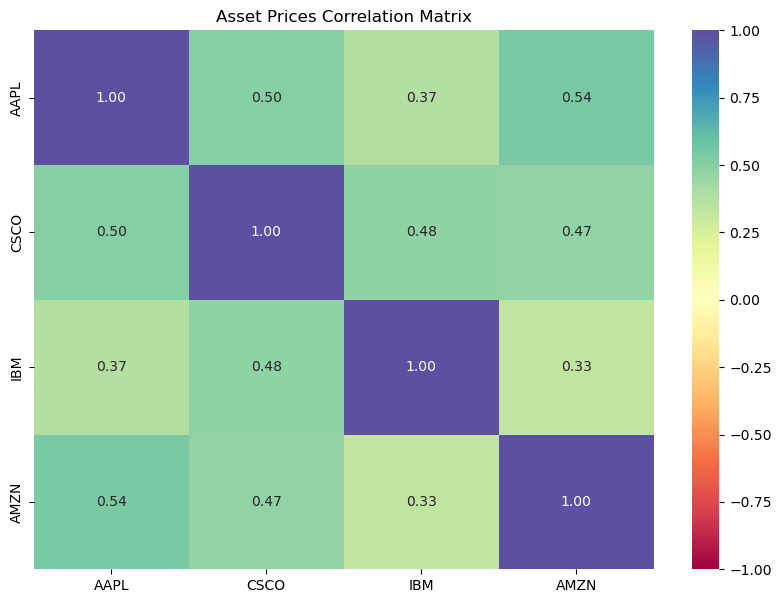

In [17]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(asset_prices_ann_corr_mtrx_df, annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral").set(title='Asset Prices Correlation Matrix')

In [18]:
print("Annual average asset returns:")
display(asset_prices_ann_returns_mean)

Annual average asset returns:


AAPL    0.274034
CSCO    0.179523
IBM     0.038211
AMZN    0.267049
dtype: float64

### Efficient Frontier Computation

In [19]:
# Determine the efficient frontier components
efficient_frontier_df = mpt_qa_get_efficient_frontier(asset_prices_df, asset_prices_ann_returns_mean, asset_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.head(n=1))
display(efficient_frontier_df.tail(n=1))

Efficient Frontier DataFrame:


,Returns,Volatility,SharpeRatio,AAPL_W,CSCO_W,IBM_W,AMZN_W
0,0.172563,2.823041,0.054042,0.292167,0.306092,0.30474,0.097001


,Returns,Volatility,SharpeRatio,AAPL_W,CSCO_W,IBM_W,AMZN_W
49999,0.184336,2.900258,0.056663,0.181038,0.327402,0.24175,0.249809


In [20]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the opt sharpe ratio points)
scatter = hv.Scatter((efficient_frontier_df['Volatility'], efficient_frontier_df['Returns'], efficient_frontier_df.loc[:,'SharpeRatio']), 'Volatility', ['Return', 'Sharpe Ratio'])

scatter.opts(title="Efficient Frontier + MinVol/MaxRet/OptSharpeRatio Selections", color='Sharpe Ratio', cmap='plasma', width=800, height=600, colorbar=True, padding=0.1)

:Scatter   [Volatility]   (Return,Sharpe Ratio)

In [21]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_returns, portfolio_opt_sharpe_ratio = mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Returns Point:")
display(portfolio_max_returns)
print("\nEfficient Frontier: Opt Sharpe Ratio Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.138951
Volatility     2.767260
SharpeRatio    0.042985
AAPL_W         0.194798
CSCO_W         0.243200
IBM_W          0.472703
AMZN_W         0.089299
Name: 7190, dtype: float64


Efficient Frontier: Max Returns Point:


Returns        0.270682
Volatility     3.595502
SharpeRatio    0.069721
AAPL_W         0.732692
CSCO_W         0.010919
IBM_W          0.002312
AMZN_W         0.254077
Name: 1656, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Point:


Returns        0.261739
Volatility     3.438830
SharpeRatio    0.070297
AAPL_W         0.582363
CSCO_W         0.103097
IBM_W          0.001547
AMZN_W         0.312993
Name: 387, dtype: float64

In [22]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the opt sharpe ratio points)
scatter = hv.Scatter((efficient_frontier_df['Volatility'], efficient_frontier_df['Returns'], efficient_frontier_df.loc[:,'SharpeRatio']), 'Volatility', ['Return', 'Sharpe Ratio'])
opt_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_returns = hv.Scatter([(portfolio_max_returns[1],portfolio_max_returns[0])])

scatter.opts(title="Efficient Frontier + MinVol/MaxReturns/OptSharpeRatio Selections", color='Sharpe Ratio', cmap='plasma', width=800, height=600, colorbar=True, padding=0.1) *\
opt_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_returns.opts(color='red', line_color='black', size=15)

:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

# Visualization for: "mpt_performance_eval.py"
---

In [68]:
portfolio_min_volatility_returns_df = mpt_pe_compute_portfolio_returns(asset_prices_returns_df, portfolio_min_volatility)
portfolio_max_returns_returns_df = mpt_pe_compute_portfolio_returns(asset_prices_returns_df, portfolio_max_returns)
portfolio_opt_sharpe_ratio_returns_df = mpt_pe_compute_portfolio_returns(asset_prices_returns_df, portfolio_opt_sharpe_ratio)

portfolio_returns_df = pd.concat([portfolio_max_returns_returns_df, portfolio_opt_sharpe_ratio_returns_df, portfolio_min_volatility_returns_df], axis=1, join='inner')
portfolio_returns_df.columns = ["Max Returns Portfolio", "Opt Sharpe Ratio Portfolio", "Min Volatility Portfolio"]

In [69]:
# Plot the asset returns
portfolio_returns_df.hvplot.line(
    ylabel="Returns", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="Market & Assets Returns"
)

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [70]:
portfolio_returns_df.hvplot.hist(bins=100, subplots=True, width=400, group_label='Ticker', grid=True).cols(3)

:NdLayout   [Default]
   :Histogram   [Min Volatility Portfolio]   (Min Volatility Portfolio_count)

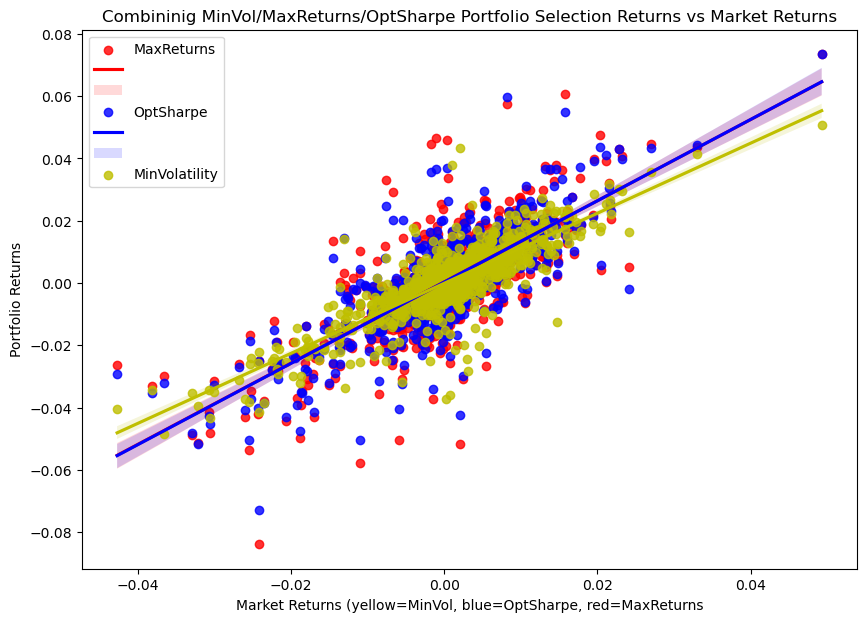

In [23]:
plt.subplots(figsize=(10,7))

sns.regplot(asset_mkt_prices_returns_df['MARKET'], portfolio_max_returns_returns_df, color='r')
sns.regplot(asset_mkt_prices_returns_df['MARKET'], portfolio_opt_sharpe_ratio_returns_df, color='b')
sns.regplot(asset_mkt_prices_returns_df['MARKET'], portfolio_min_volatility_returns_df, color='y')
plt.xlabel("Market Returns (yellow=MinVol, blue=OptSharpe, red=MaxReturns")
plt.ylabel("Portfolio Returns")
plt.legend(["MaxReturns", "", "", "OptSharpe", "", "", "MinVolatility"])
plt.title("Combininig MinVol/MaxReturns/OptSharpe Portfolio Selection Returns vs Market Returns")
plt.show()

<AxesSubplot:title={'center':'Portfolio Composition - Min Volatility Protfolio'}, ylabel='weights'>

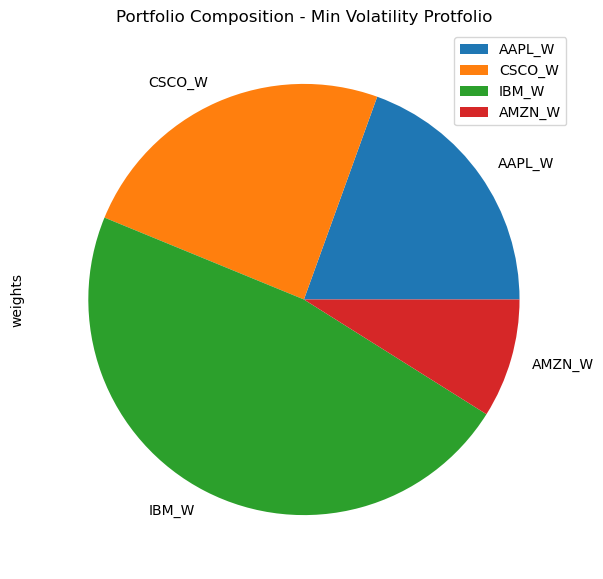

In [24]:
portfolio_min_volatility_weights = mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# plot the pie charts of the porfolio allocation/weights
portfolio_min_volatility_weights.plot.pie(y='weights', title='Portfolio Composition - Min Volatility Protfolio', figsize=(10,7))

<AxesSubplot:title={'center':'Portfolio Composition - Max Returns Protfolio'}, ylabel='weights'>

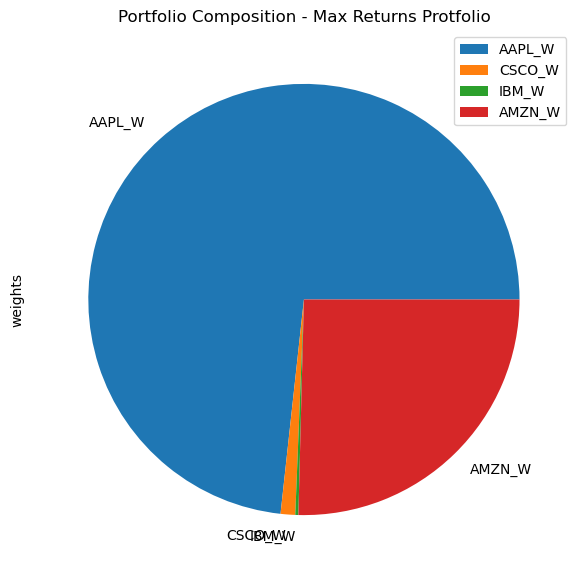

In [25]:
portfolio_max_returns_weights = mpt_pe_get_portfolio_weights_df(portfolio_max_returns)

# plot the pie charts of the porfolio allocation/weights
portfolio_max_returns_weights.plot.pie(y='weights', title='Portfolio Composition - Max Returns Protfolio', figsize=(10,7))

<AxesSubplot:title={'center':'Portfolio Composition - Opt Sharpe Ratio Protfolio'}, ylabel='weights'>

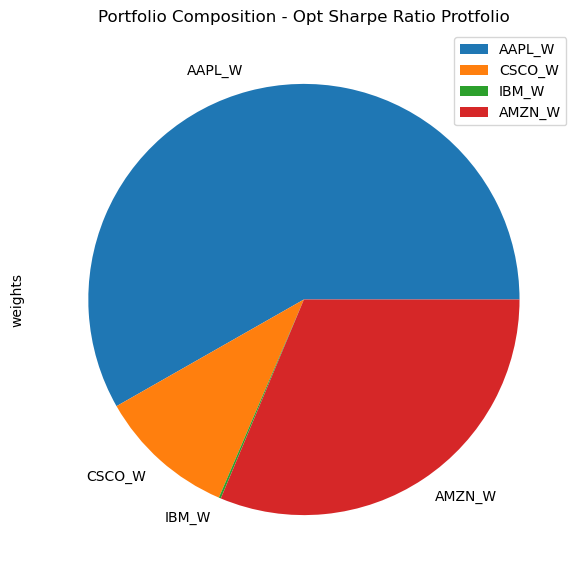

In [26]:
portfolio_opt_sharpe_ratio_weights = mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# plot the pie charts of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.plot.pie(y='weights', title='Portfolio Composition - Opt Sharpe Ratio Protfolio', figsize=(10,7))

In [74]:
portfolio_cum_returns_df = (1 + portfolio_returns_df).cumprod() - 1
# Plot the Portfolio cumulative returns
portfolio_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="MinVol/MaxRet/OptSharpeRatio Portfolio Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [76]:
# Use the daily return data to create box plots to visualize the volatility of the portfolio 
portfolio_cum_returns_df.hvplot(
    kind = "box",
    width = 800,
    height = 500,
    title = "MinVol/MaxRet/OptSharpeRatio Portfolio Returns Box Plot")

:BoxWhisker   [Variable]   (value)

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [27]:
asset_prices_test_beg_df = pd.DataFrame(asset_mkt_prices_full_df.iloc[num_historical_days_percent, :]).drop('MARKET', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(asset_mkt_prices_full_df.iloc[num_days_total-1, :]).drop('MARKET', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,AAPL,CSCO,IBM,AMZN
2020-01-03,72.967216,43.69313,112.016403,93.748497


,AAPL,CSCO,IBM,AMZN
2020-12-31,131.333511,42.152077,110.466835,162.846497


In [28]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_volatility_weights = mpt_pe_get_mc_weights(portfolio_min_volatility_weights)
portfolio_mc_max_returns_weights = mpt_pe_get_mc_weights(portfolio_max_returns_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)

In [29]:
investment_pnl_min_volatility = mpt_pe_compute_investment_pnl(initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_volatility_weights))[0][0]
investment_pnl_max_returns = mpt_pe_compute_investment_pnl(initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_returns_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt_pe_compute_investment_pnl(initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]

print("Actual realized portfolio value for minVol/maxReturns/optSharpe allocations:")
display(investment_pnl_min_volatility)
display(investment_pnl_max_returns)
display(investment_pnl_opt_sharpe_ratio)

Actual realized portfolio value for minVol/maxReturns/optSharpe allocations:


12174.593139648438

17614.510696411133

16892.26513671875

### Run Monte Carlo Simulations on the test dataframe and compute expected Returns and compare agains realized returns

In [30]:
print("Number of MC runs:", num_mc_runs)

Number of MC runs: 500


In [31]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('MARKET', axis=1, inplace=False)

In [32]:
# Arrange Monte Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [33]:
# Configure the Monte Carlo simulation to forecast 30 years cumulative returns
# The weights should be split 40% to AGG and 60% to SPY.
# Run 500 samples.
MC_min_volatility_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_volatility_weights,
    num_simulation = num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min Volatility)")
MC_min_volatility_portfolio.portfolio_data.tail(n=1)

Monte Carlo Portfolio (Min Volatility)


AAPL                    CSCO                     IBM  \
                 close daily_return      close daily_return      close   
Date                                                                     
2020-12-30  132.353012    -0.008527  41.897755    -0.003584  109.11541   

                               AMZN               
           daily_return       close daily_return  
Date                                              
2020-12-30     0.004362  164.292496    -0.010882

In [34]:
# Run the Monte Carlo simulation to forecast 10 years cumulative returns
MC_min_volatility_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.000867,1.006534,1.015025,0.972554,1.023260,1.011448,1.004071,1.005870,1.000390,1.009112,...,0.997413,1.042245,1.015035,1.013034,1.002529,1.007394,0.989086,0.983691,0.993367,1.033509
2,0.990588,1.020311,1.003994,0.962917,1.029993,0.994156,0.988410,1.017489,1.015679,1.019879,...,0.990537,1.054541,0.994079,1.038137,0.996703,1.023154,0.980379,0.982157,0.998101,1.020775
3,0.993326,1.007440,1.022362,0.959896,1.029779,1.015633,0.994095,1.034635,1.003397,1.010050,...,0.993391,1.043952,0.978328,1.059237,1.001017,1.024565,1.011024,0.961886,1.016201,1.044573
4,1.016416,1.016137,1.031725,0.968850,1.027019,1.017739,1.018216,1.056701,0.998956,0.988639,...,1.010312,1.052191,0.964601,1.071797,1.022686,1.041064,1.007118,0.967800,1.021039,1.050016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.464033,1.527771,1.493929,1.359029,1.313026,1.927802,1.277865,1.080623,1.070326,0.816766,...,1.554291,1.232725,1.048905,1.233486,1.353825,1.031845,1.545197,1.445936,1.299186,1.227712
249,1.469530,1.541419,1.462093,1.344479,1.295473,1.890387,1.265720,1.099431,1.069344,0.830553,...,1.535527,1.236449,1.075805,1.229098,1.341844,1.020647,1.568306,1.424409,1.304193,1.238853
250,1.434969,1.545635,1.464003,1.326224,1.300563,1.871553,1.243709,1.101969,1.081589,0.845732,...,1.546214,1.251472,1.070710,1.231621,1.293320,1.042001,1.553507,1.461584,1.303177,1.223689
251,1.436169,1.526028,1.514440,1.270694,1.341688,1.876896,1.246562,1.091259,1.079399,0.837071,...,1.575323,1.249658,1.050097,1.249866,1.289863,1.054131,1.565273,1.397824,1.306060,1.196982


In [35]:
# Configure the Monte Carlo simulation to forecast 30 years cumulative returns
# The weights should be split 40% to AGG and 60% to SPY.
# Run 500 samples.
MC_max_returns_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_returns_weights,
    num_simulation = num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max Returns)")
MC_max_returns_portfolio.portfolio_data.tail(n=1)

Monte Carlo Portfolio (Max Returns)


AAPL                    CSCO                     IBM  \
                 close daily_return      close daily_return      close   
Date                                                                     
2020-12-30  132.353012    -0.008527  41.897755    -0.003584  109.11541   

                               AMZN               
           daily_return       close daily_return  
Date                                              
2020-12-30     0.004362  164.292496    -0.010882

In [36]:
# Run the Monte Carlo simulation to forecast 10 years cumulative returns
MC_max_returns_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.032754,0.987864,1.013823,1.002601,0.996814,0.991054,0.944944,1.030461,1.007947,1.024284,...,0.990549,1.033697,1.017588,1.041888,1.038761,0.997578,1.030654,1.013414,1.011609,1.038861
2,1.045615,1.015493,1.026747,1.010712,1.014803,0.960582,0.927156,1.046845,1.001769,1.049399,...,0.983227,1.068801,1.032650,1.091694,1.025178,1.009948,1.052167,1.070371,1.019676,1.067613
3,1.068265,1.017862,1.006778,0.980244,1.020204,0.929882,0.940969,1.046637,1.010101,1.025043,...,0.950726,1.079673,1.022808,1.089383,1.045802,1.030567,1.037308,1.105447,1.049876,1.053916
4,1.085944,1.029040,0.984305,0.934980,1.024045,0.938396,0.910965,1.018597,1.012964,1.016941,...,0.933764,1.067559,1.016938,1.071382,1.036131,1.083234,1.084791,1.088408,1.056342,1.062671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,2.334123,2.546634,0.951209,1.262989,3.012254,0.972764,1.451650,2.633604,0.756965,0.725661,...,1.514096,2.117415,2.884995,1.991273,1.649563,1.701812,1.282988,1.003386,1.760704,1.858411
249,2.335535,2.597647,0.982489,1.302321,3.015159,0.963076,1.417743,2.640122,0.760999,0.716044,...,1.561389,2.171674,2.825557,1.998834,1.590913,1.738741,1.251619,0.999893,1.788860,1.903895
250,2.449536,2.622030,1.009559,1.323919,3.044314,0.958321,1.449787,2.741825,0.763988,0.686735,...,1.555848,2.201137,2.816338,2.076749,1.545058,1.821677,1.303428,1.019229,1.833001,1.950435
251,2.476991,2.611989,1.024160,1.338628,3.020283,0.959313,1.445603,2.799805,0.757423,0.705532,...,1.588151,2.139662,2.852618,2.128475,1.535838,1.823659,1.284754,1.034772,1.819625,1.966090


In [37]:
# Configure the Monte Carlo simulation to forecast 30 years cumulative returns
# The weights should be split 40% to AGG and 60% to SPY.
# Run 500 samples.
MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail(n=1)

Monte Carlo Portfolio (Opt Sharpe)


AAPL                    CSCO                     IBM  \
                 close daily_return      close daily_return      close   
Date                                                                     
2020-12-30  132.353012    -0.008527  41.897755    -0.003584  109.11541   

                               AMZN               
           daily_return       close daily_return  
Date                                              
2020-12-30     0.004362  164.292496    -0.010882

In [38]:
# Run the Monte Carlo simulation to forecast 10 years cumulative returns
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.020759,0.959251,1.013447,0.989953,1.029570,1.014840,0.991993,0.972406,0.998359,1.001551,...,0.971592,0.993748,0.983837,0.976817,1.007964,0.990273,1.015754,1.015183,0.985749,0.978796
2,1.017863,0.971871,1.015172,0.986832,1.015953,1.003493,1.036996,0.966089,1.022103,0.978194,...,0.959824,1.014965,1.002974,0.965502,1.005943,1.002261,0.999027,1.034110,1.011726,1.001522
3,1.035009,0.957230,1.036276,1.007310,1.012850,0.994021,1.015096,0.971154,1.025440,0.980962,...,0.974348,0.982777,1.002944,0.975340,1.004816,1.030229,1.016997,1.055111,1.022285,1.021299
4,1.025838,0.934084,1.099202,0.995165,1.061942,1.004230,0.992911,0.986734,1.042044,0.971852,...,0.985901,0.988470,1.018395,0.964640,1.020773,1.059475,1.042357,1.079201,1.035818,1.014180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.981999,1.273188,2.087473,1.825541,2.242358,1.694256,2.625679,1.468096,1.855041,1.927311,...,1.126200,1.160412,2.249124,1.769618,1.979753,1.490763,1.599789,2.861533,1.569737,2.747461
249,2.022366,1.288356,2.104674,1.893391,2.274218,1.688730,2.626871,1.499917,1.877208,1.917091,...,1.113016,1.161020,2.226726,1.779139,1.957687,1.542877,1.607688,2.933875,1.595570,2.839741
250,2.033194,1.280727,2.089797,1.907687,2.355114,1.669965,2.622056,1.526706,1.871184,1.927304,...,1.127567,1.140652,2.290127,1.795520,1.905118,1.573778,1.619378,2.925587,1.652763,2.772169
251,2.074339,1.302546,2.074477,1.899296,2.368544,1.616237,2.579261,1.561217,1.832712,1.931103,...,1.146185,1.133417,2.298993,1.844943,1.881388,1.550726,1.622248,2.969906,1.644578,2.840464


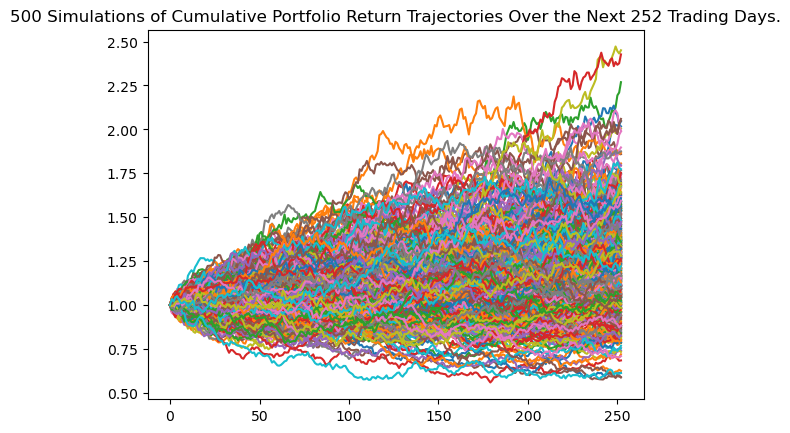

In [39]:
# Visualize the 30-year Monte Carlo simulation by creating an
# overlay line plot
line_plot_min_volatility_portfolio_plot = MC_min_volatility_portfolio.plot_simulation()

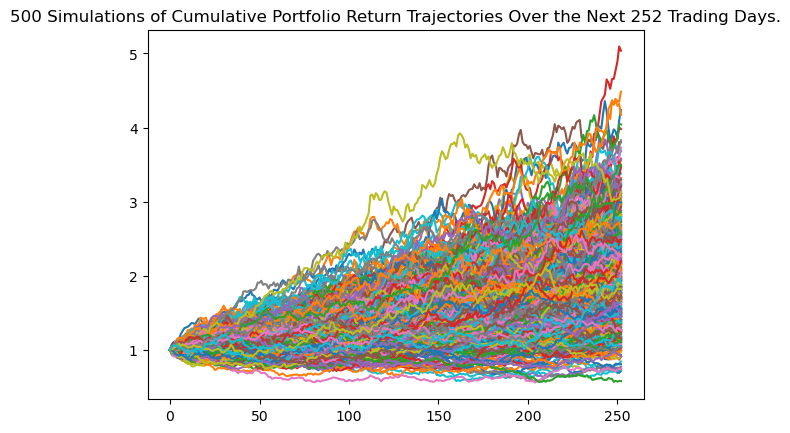

In [40]:
# Visualize the 30-year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_returns_portfolio_plot = MC_max_returns_portfolio.plot_simulation()

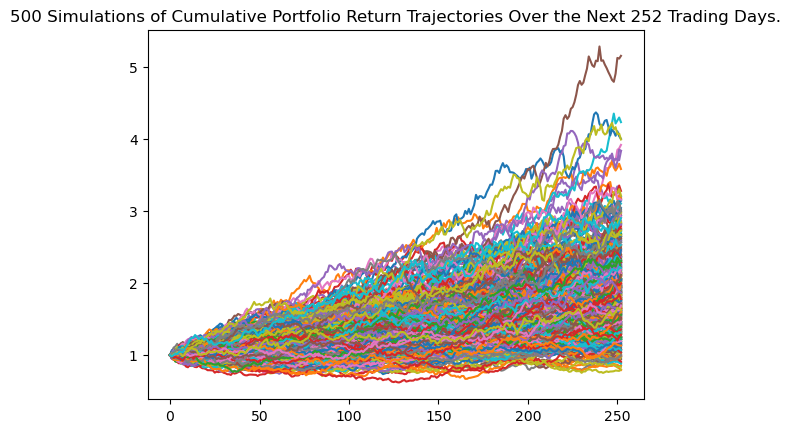

In [41]:
# Visualize the 30-year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

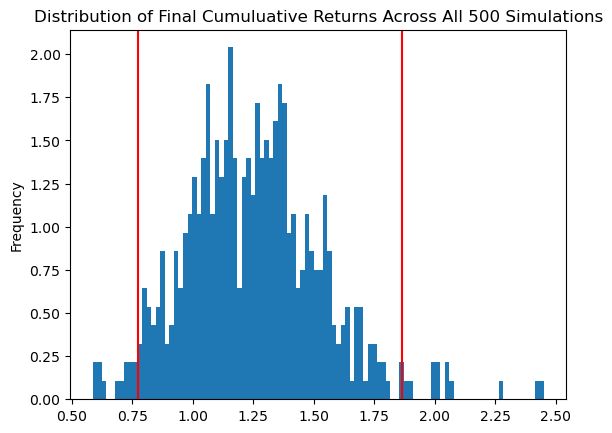

In [42]:
# Visualize the probability distribution of the 30-year Monte Carlo simulation 
# by plotting a histogram
distribution_plot_min_volatility_portfolio_plot = MC_min_volatility_portfolio.plot_distribution()

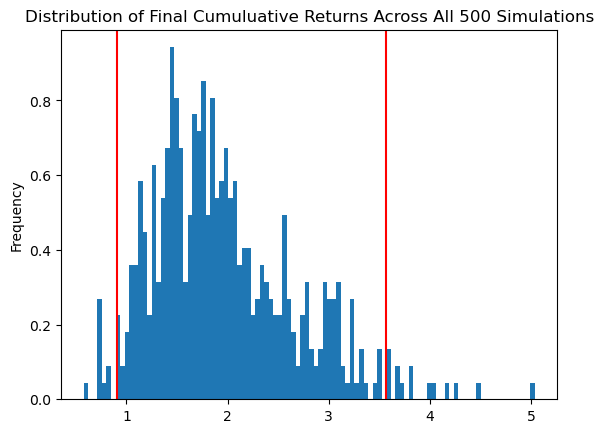

In [43]:
# Visualize the probability distribution of the 30-year Monte Carlo simulation 
# by plotting a histogram
distribution_plot_max_returns_portfolio_plot = MC_max_returns_portfolio.plot_distribution()

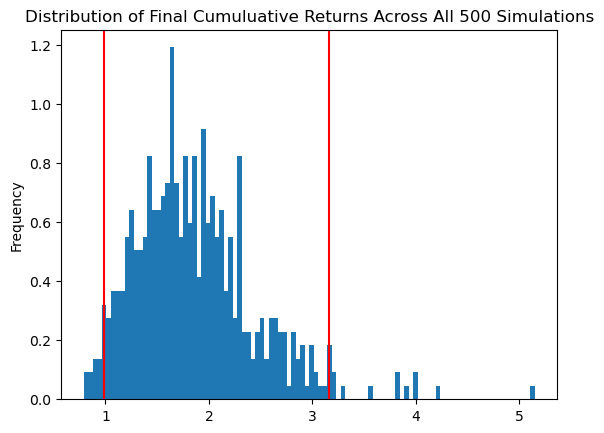

In [44]:
# Visualize the probability distribution of the 30-year Monte Carlo simulation 
# by plotting a histogram
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

In [45]:
# Generate summary statistics from the 30-year Monte Carlo simulation results
# Save the results as a variable
table_min_volatility_portfolio_weight = MC_min_volatility_portfolio.summarize_cumulative_return()

# Review the 30-year Monte Carlo summary statistics
print(table_min_volatility_portfolio_weight)

count           500.000000
mean              1.252043
std               0.280277
min               0.587243
25%               1.060195
50%               1.242161
75%               1.408477
max               2.450594
95% CI Lower      0.775370
95% CI Upper      1.862952
Name: 252, dtype: float64


In [46]:
# Generate summary statistics from the 30-year Monte Carlo simulation results
# Save the results as a variable
table_max_returns_portfolio_weight = MC_max_returns_portfolio.summarize_cumulative_return()

# Review the 30-year Monte Carlo summary statistics
print(table_max_returns_portfolio_weight)

count           500.000000
mean              1.958541
std               0.702857
min               0.579481
25%               1.452914
50%               1.833194
75%               2.343210
max               5.037137
95% CI Lower      0.910971
95% CI Upper      3.566837
Name: 252, dtype: float64


In [47]:
# Generate summary statistics from the 30-year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 30-year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           500.000000
mean              1.862681
std               0.590521
min               0.792091
25%               1.445287
50%               1.779812
75%               2.158959
max               5.149309
95% CI Lower      0.987308
95% CI Upper      3.164685
Name: 252, dtype: float64


In [48]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [49]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN Volatility portfolio

# get the lower and upper CI values
ci_lower_95per = table_min_volatility_portfolio_weight[8]
ci_upper_95per = table_min_volatility_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current MIN Volatility portfolio value of ${initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio is ${investment_pnl_min_volatility:0.2f}")


There is a 95% chance that the current MIN Volatility portfolio value of $10000.00, will end within the range of $7753.70 and $18629.52.
The actual realized value of the portfolio is $12174.59


In [50]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX Returns portfolio

# get the lower and upper CI values
ci_lower_95per = table_max_returns_portfolio_weight[8]
ci_upper_95per = table_max_returns_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current MAX Returns portfolio value of ${initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio is ${investment_pnl_max_returns:0.2f}")


There is a 95% chance that the current MAX Returns portfolio value of $10000.00, will end within the range of $9109.71 and $35668.37.
The actual realized value of the portfolio is $17614.51


In [51]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current OPT SHARPE RATIO  portfolio value of ${initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio is ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current OPT SHARPE RATIO  portfolio value of $10000.00, will end within the range of $9873.08 and $31646.85.
The actual realized value of the portfolio is $16892.27
